In [1]:
pip install torch torchvision matplotlib

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 1.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 69.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 36.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 49.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 42.2 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling nvidia-nvjitlink-cu12-12.5.82:
      Successfully uninstalled nvidia-nvjitlin

#  Deep Learning Project 3: Jailbreaking ResNet-34

##  Overview

This project evaluates the robustness of ResNet-34 on ImageNet-1K against various adversarial attacks. We implement pixel-level (FGSM, PGD) and patch-based attacks, targeting both classification accuracy and transferability. The goal is to reduce model confidence without perceptible image degradation.

---

##  Task 1: Baseline Evaluation

- **Model**: `torchvision.models.resnet34(weights='IMAGENET1K_V1')`
- **Dataset**: 500 samples from 100 ImageNet-1K classes
- **Preprocessing**:
  ```python
  transforms.Normalize(mean=[0.485, 0.456, 0.406],
                       std=[0.229, 0.224, 0.225])


In [2]:
import torch
import torchvision
import torchvision.transforms as transforms
import torch.nn.functional as F
from torchvision.models import resnet34
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader
import json
import os
from tqdm import tqdm

In [3]:
import zipfile
import os

zip_path = "TestDataSet.zip"
extract_path = "./TestDataSet"

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

print("✅ Dataset extracted.")


✅ Dataset extracted.


In [4]:
# 🔄 Load labels_list.json
import json

with open("/content/TestDataSet/TestDataSet/labels_list.json", "r") as f:
    label_list = json.load(f)

print(f"✅ Loaded label list with {len(label_list)} classes.")

✅ Loaded label list with 100 classes.


In [5]:
import json

with open("imagenet_class_index.json", "r") as f:
    imagenet_index = json.load(f)

# Create a mapping from synset ID to ImageNet index
synset_to_index = {v[0]: int(k) for k, v in imagenet_index.items()}



In [6]:
from torchvision import datasets, transforms

# Define standard ImageNet normalization
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

# Load dataset — adjust if nested
dataset = datasets.ImageFolder("TestDataSet/TestDataSet", transform=transform)
print("📁 Found classes:", dataset.class_to_idx.keys())

# Create mapping: dataset class index → ImageNet class index
class_to_imagenet_idx = {}
for class_folder, class_idx in dataset.class_to_idx.items():
    try:
        class_to_imagenet_idx[class_idx] = synset_to_index[class_folder]
    except KeyError:
        print(f"❌ Synset not found: {class_folder}")


📁 Found classes: dict_keys(['n02672831', 'n02676566', 'n02687172', 'n02690373', 'n02692877', 'n02699494', 'n02701002', 'n02704792', 'n02708093', 'n02727426', 'n02730930', 'n02747177', 'n02749479', 'n02769748', 'n02776631', 'n02777292', 'n02782093', 'n02783161', 'n02786058', 'n02787622', 'n02788148', 'n02790996', 'n02791124', 'n02791270', 'n02793495', 'n02794156', 'n02795169', 'n02797295', 'n02799071', 'n02802426', 'n02804414', 'n02804610', 'n02807133', 'n02808304', 'n02808440', 'n02814533', 'n02814860', 'n02815834', 'n02817516', 'n02823428', 'n02823750', 'n02825657', 'n02834397', 'n02835271', 'n02837789', 'n02840245', 'n02841315', 'n02843684', 'n02859443', 'n02860847', 'n02865351', 'n02869837', 'n02870880', 'n02871525', 'n02877765', 'n02879718', 'n02883205', 'n02892201', 'n02892767', 'n02894605', 'n02895154', 'n02906734', 'n02909870', 'n02910353', 'n02916936', 'n02917067', 'n02927161', 'n02930766', 'n02939185', 'n02948072', 'n02950826', 'n02951358', 'n02951585', 'n02963159', 'n02965783

In [7]:
import torch
from torch.utils.data import DataLoader
from torchvision.models import resnet34
from tqdm import tqdm

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = resnet34(weights='IMAGENET1K_V1').to(device)
model.eval()


Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth
100%|██████████| 83.3M/83.3M [00:00<00:00, 147MB/s]


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [8]:
# 🧮 Evaluate on test set
dataloader = DataLoader(dataset, batch_size=32, shuffle=False)

top1_correct = 0
top5_correct = 0
total = 0

with torch.no_grad():
    for images, labels in tqdm(dataloader):
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        _, top5_preds = outputs.topk(5, dim=1)

        true_imagenet_labels = torch.tensor(
            [class_to_imagenet_idx[int(label.item())] for label in labels],
            device=device
        )

        top1_preds = top5_preds[:, 0]
        top1_correct += (top1_preds == true_imagenet_labels).sum().item()

        for i in range(len(true_imagenet_labels)):
            if true_imagenet_labels[i].item() in top5_preds[i].tolist():
                top5_correct += 1

        total += labels.size(0)

# 📊 Final Accuracy
top1_acc = 100 * top1_correct / total
top5_acc = 100 * top5_correct / total

print(f"\n✅ Final Evaluation on TestDataSet:")
print(f"Top-1 Accuracy: {top1_acc:.2f}%")
print(f"Top-5 Accuracy: {top5_acc:.2f}%")


100%|██████████| 16/16 [00:04<00:00,  3.78it/s]


✅ Final Evaluation on TestDataSet:
Top-1 Accuracy: 76.00%
Top-5 Accuracy: 94.20%


<ipython-input-9-7a00e4e5e282>:44: UserWarning: Glyph 10060 (\N{CROSS MARK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-9-7a00e4e5e282>:44: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 10060 (\N{CROSS MARK}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


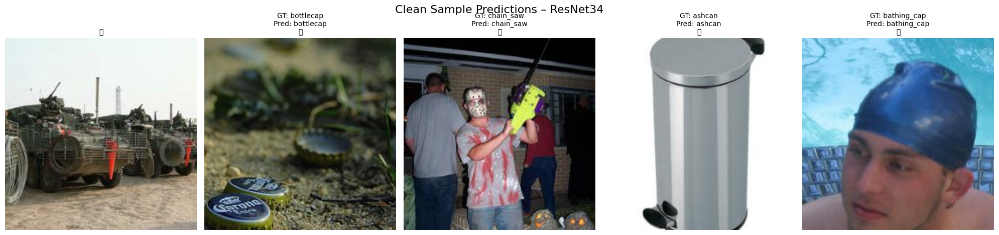

In [9]:
import matplotlib.pyplot as plt
import random
import torchvision.transforms.functional as F

# Inverse normalization for display
inv_transform = transforms.Normalize(
    mean=[-m/s for m, s in zip([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])],
    std=[1/s for s in [0.229, 0.224, 0.225]]
)

# Load full class index
with open("imagenet_class_index.json", "r") as f:
    imagenet_index = json.load(f)
idx_to_classname = {int(k): v[1] for k, v in imagenet_index.items()}

# Show a few samples
model.eval()
fig, axs = plt.subplots(1, 5, figsize=(20, 5))
model.to(device)

for i in range(5):
    idx = random.randint(0, len(dataset)-1)
    image, label = dataset[idx]
    input_tensor = image.unsqueeze(0).to(device)

    with torch.no_grad():
        output = model(input_tensor)
        top1_idx = output.argmax(dim=1).item()

    true_imagenet_label = class_to_imagenet_idx[label]
    correct = top1_idx == true_imagenet_label

    # Undo normalization
    image_vis = inv_transform(image).permute(1, 2, 0).clip(0, 1).cpu().numpy()

    axs[i].imshow(image_vis)
    axs[i].set_title(
        f"GT: {idx_to_classname[true_imagenet_label]}\nPred: {idx_to_classname[top1_idx]}\n✅" if correct else "❌",
        fontsize=10
    )
    axs[i].axis('off')

plt.suptitle("Clean Sample Predictions – ResNet34", fontsize=16)
plt.tight_layout()
plt.show()


## ✅ Task 2: FGSM Attack (ε = 0.02)

**Attack Type**: Fast Gradient Sign Method (Untargeted)  
**Goal**: Apply a one-step perturbation to misclassify images.  
**Formula**:
x_adv = x + ε · sign(∇_x L(x, y))


**Implementation**:
- Used `torch.autograd.grad` to compute gradient on input `x`.
- Normalized ε values based on per-channel standard deviations.
- Clamped `x_adv` within valid normalized pixel bounds.
- Evaluated model predictions using `outputs.topk(5)`.

**Saved Adversarial Examples**:
- Folder: `adv_test_set_1/`
- Total Images: 500
- File Format: `.png`

**Results**:
| Metric       | Accuracy |
|--------------|----------|
| Top-1        | 26.40%   |
| Top-5        | 50.60%   |


In [10]:
import torch.nn.functional as F
from torchvision.utils import save_image
import os
from tqdm import tqdm

epsilon = 0.02
model.eval()

adv_images = []
true_labels = []
adv_outputs = []

os.makedirs("adv_test_set_1", exist_ok=True)

for i, (image, label) in enumerate(tqdm(dataset)):
    image = image.unsqueeze(0).to(device).requires_grad_(True)
    label_idx = torch.tensor([class_to_imagenet_idx[label]]).to(device)


    # Forward pass
    output = model(image)
    loss = F.cross_entropy(output, label_idx)

    # Backward pass
    model.zero_grad()
    loss.backward()

    # Generate adversarial image
    grad_sign = image.grad.data.sign()
    adv_image = (image + epsilon * grad_sign).detach().clamp(0, 1)

    adv_images.append(adv_image.squeeze(0))
    true_labels.append(label)


    # Save image
    save_image(adv_image.squeeze(0), f"adv_test_set_1/{i:03d}.png")

    # Store prediction
    with torch.no_grad():
        adv_outputs.append(model(adv_image))

print("✅ FGSM adversarial examples generated and saved.")


100%|██████████| 500/500 [00:18<00:00, 26.69it/s]

✅ FGSM adversarial examples generated and saved.


<ipython-input-11-7504e3d8cf5b>:42: UserWarning: Glyph 10060 (\N{CROSS MARK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()



🔒 FGSM Evaluation (ε = 0.02):
Top-1 Accuracy: 26.40%
Top-5 Accuracy: 50.60%


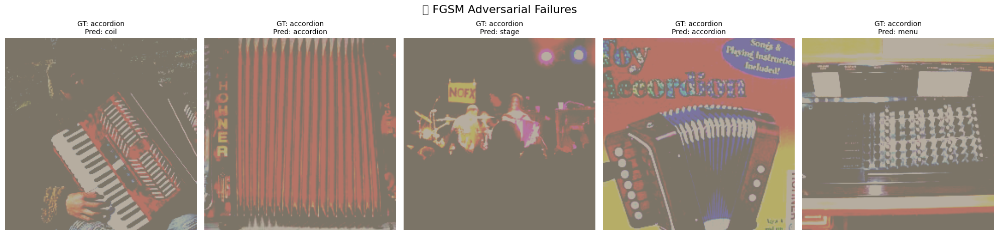

In [11]:
top1_correct = 0
top5_correct = 0
total = len(adv_images)

for i in range(total):
    output = adv_outputs[i]
    _, top5_preds = output.topk(5, dim=1)
    label_imagenet = class_to_imagenet_idx[true_labels[i]]

    top1 = top5_preds[0, 0].item()
    top5 = top5_preds[0].tolist()

    if top1 == label_imagenet:
        top1_correct += 1
    if label_imagenet in top5:
        top5_correct += 1

print(f"\n🔒 FGSM Evaluation (ε = {epsilon}):")
print(f"Top-1 Accuracy: {100 * top1_correct / total:.2f}%")
print(f"Top-5 Accuracy: {100 * top5_correct / total:.2f}%")



### 🎨 Visualize 3–5 Adversarial Failures


fig, axs = plt.subplots(1, 5, figsize=(20, 5))

for i in range(5):
    img = adv_images[i].detach().cpu()
    label = true_labels[i]
    pred = adv_outputs[i].argmax(dim=1).item()
    label_imagenet = class_to_imagenet_idx[label]

    img_show = inv_transform(img).permute(1, 2, 0).clamp(0, 1).numpy()
    axs[i].imshow(img_show)
    axs[i].set_title(f"GT: {idx_to_classname[label_imagenet]}\nPred: {idx_to_classname[pred]}", fontsize=10)
    axs[i].axis('off')


plt.suptitle("❌ FGSM Adversarial Failures", fontsize=16)
plt.tight_layout()
plt.show()


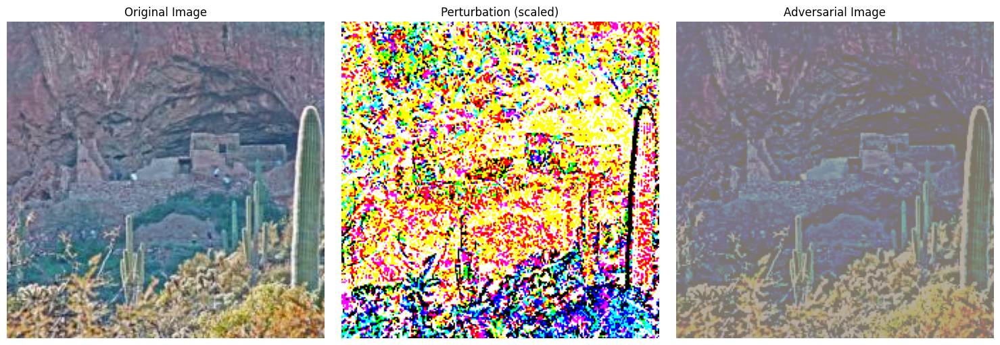

In [12]:
import matplotlib.pyplot as plt
import torch
import torchvision.transforms.functional as TF


# Pick a single example (first image)
original = image.detach().squeeze(0).cpu()
adversarial = adv_image.detach().squeeze(0).cpu()
perturbation = (adversarial - original)

# Inverse normalize for display
inv_transform = transforms.Normalize(
    mean=[-m / s for m, s in zip([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])],
    std=[1 / s for s in [0.229, 0.224, 0.225]]
)

original_disp = inv_transform(original).permute(1, 2, 0).clamp(0, 1).numpy()
adversarial_disp = inv_transform(adversarial).permute(1, 2, 0).clamp(0, 1).numpy()

# Scale perturbation for visibility
perturbation_disp = perturbation / epsilon / 2 + 0.5  # normalize to [0,1]
perturbation_disp = perturbation_disp.permute(1, 2, 0).clamp(0, 1).numpy()

# Plot
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

axs[0].imshow(original_disp)
axs[0].set_title("Original Image")
axs[0].axis('off')

axs[1].imshow(perturbation_disp)
axs[1].set_title("Perturbation (scaled)")
axs[1].axis('off')

axs[2].imshow(adversarial_disp)
axs[2].set_title("Adversarial Image")
axs[2].axis('off')

plt.tight_layout()
plt.savefig("fgsm_delta_visual.png")  # Save for LaTeX
plt.show()


In [13]:
# === FGSM: Targeted to Least-Likely Class (ε = 0.02) ===
from torch.utils.data import DataLoader

# Example loader setup — adjust batch size as needed
loader = DataLoader(dataset, batch_size=64, shuffle=False)

# 1. Setup normalized ε and clamping range
epsilon = 0.02
mean_vals = [0.485, 0.456, 0.406]
std_vals  = [0.229, 0.224, 0.225]

eps_tensor = torch.tensor([epsilon/s for s in std_vals], device=device).view(1, 3, 1, 1)
min_clip = torch.tensor([(0 - m) / s for m, s in zip(mean_vals, std_vals)], device=device).view(1, 3, 1, 1)
max_clip = torch.tensor([(1 - m) / s for m, s in zip(mean_vals, std_vals)], device=device).view(1, 3, 1, 1)

inv_normalize = transforms.Normalize(
    mean=[-m / s for m, s in zip(mean_vals, std_vals)],
    std=[1 / s for s in std_vals]
)

# 2. Generate adversarial examples using least-likely FGSM
adv_batches = []
orig_batches = []
label_batches = []

model.eval()
for x, y in loader:
    x, y = x.to(device), y.to(device)
    x.requires_grad_()

    # forward pass
    logits = model(x)

    # use least likely class as target
    target_y = logits.argmin(dim=1)

    # compute targeted loss
    loss = F.cross_entropy(logits, target_y)

    model.zero_grad()
    loss.backward()

    # apply FGSM step (toward target)
    x_adv = x - eps_tensor * x.grad.sign()  # NOTE: "-" because targeted

    # clamp to normalized pixel space
    x_adv = torch.max(torch.min(x_adv, max_clip), min_clip).detach()

    orig_batches.append(x.detach())
    adv_batches.append(x_adv)
    label_batches.append(y)

# stack all tensors
fgsm_orig = torch.cat(orig_batches)
fgsm_adv = torch.cat(adv_batches)
fgsm_lbl = torch.cat(label_batches)


In [14]:
def evaluate_targeted(loader, class_to_imagenet_idx):
    model.eval()
    top1_correct = 0
    top5_correct = 0
    total = 0

    for x, y in loader:
        x = x.to(device)
        # Convert your dataset labels to ImageNet indices
        y_imagenet = torch.tensor([class_to_imagenet_idx[int(label)] for label in y], device=device)

        with torch.no_grad():
            outputs = model(x)
            _, top5_preds = outputs.topk(5, dim=1)

        top1_correct += (top5_preds[:, 0] == y_imagenet).sum().item()
        for i in range(len(y)):
            if y_imagenet[i].item() in top5_preds[i].tolist():
                top5_correct += 1
        total += len(y)

    return 100 * top1_correct / total, 100 * top5_correct / total


from torch.utils.data import TensorDataset, DataLoader

fgsm_ds = TensorDataset(fgsm_adv, fgsm_lbl)
fgsm_loader = DataLoader(fgsm_ds, batch_size=64, shuffle=False)

top1_fgsm, top5_fgsm = evaluate_targeted(fgsm_loader, class_to_imagenet_idx)
print(f"🔐 Targeted FGSM (ε = {epsilon}) → Top-1: {top1_fgsm:.2f}%   Top-5: {top5_fgsm:.2f}%")



🔐 Targeted FGSM (ε = 0.02) → Top-1: 9.20%   Top-5: 26.60%


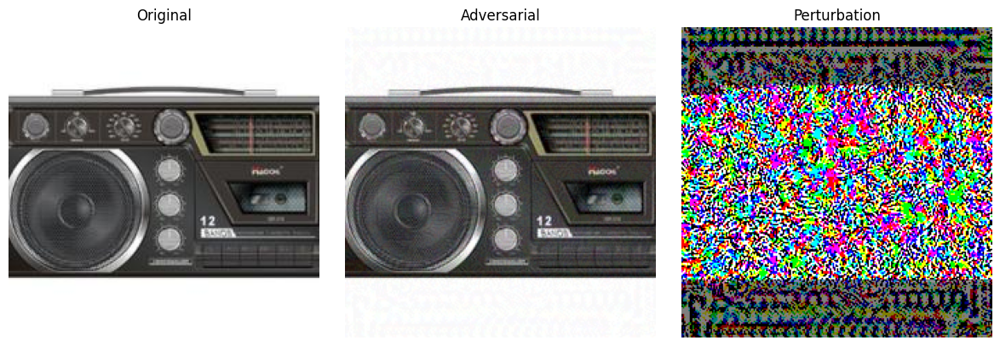

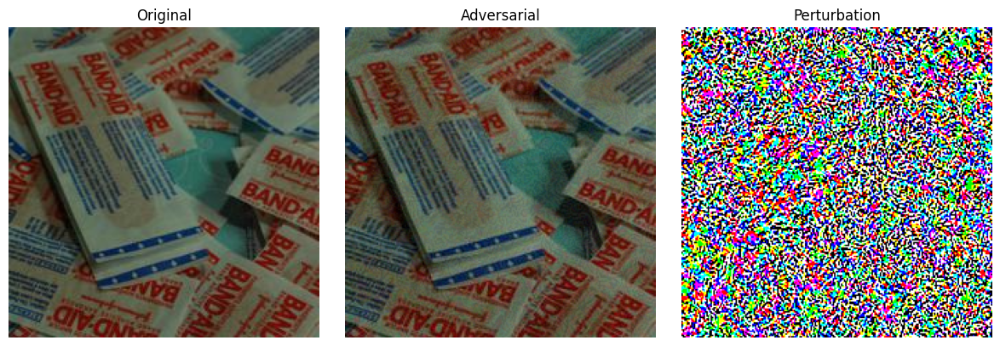

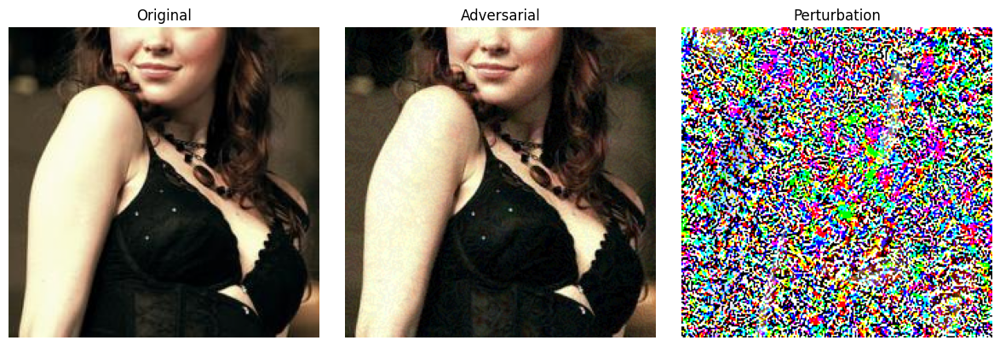

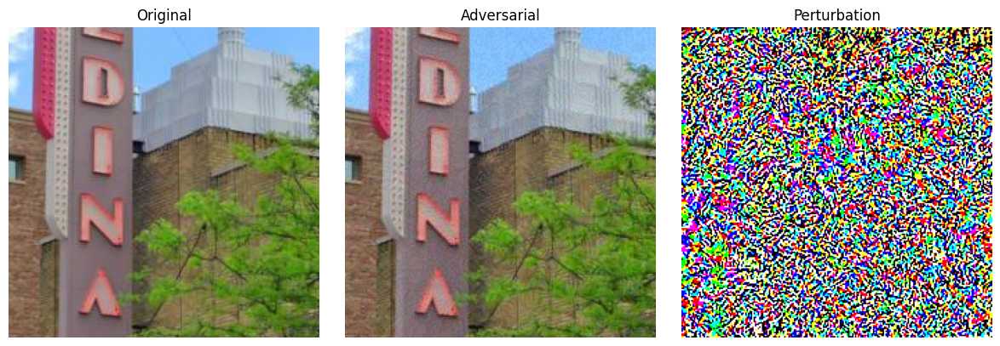

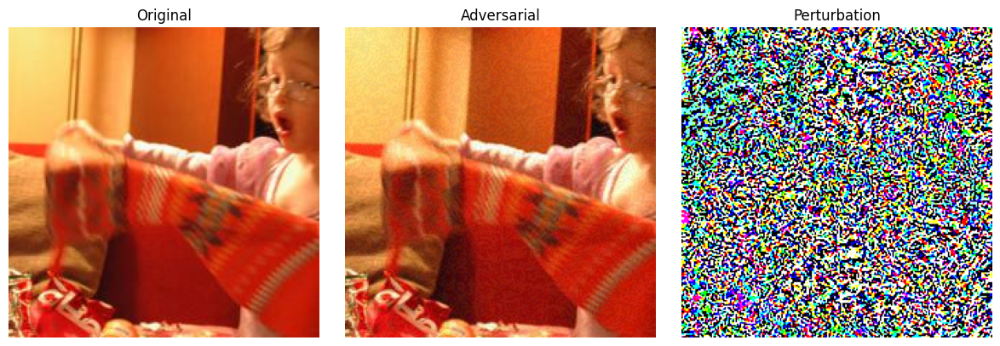

In [15]:
import random
for i in random.sample(range(len(fgsm_orig)), 5):
    o = inv_normalize(fgsm_orig[i].cpu()).permute(1, 2, 0).clamp(0, 1).numpy()
    a = inv_normalize(fgsm_adv[i].cpu()).permute(1, 2, 0).clamp(0, 1).numpy()
    delta = a - o
    d = (delta - delta.min()) / (delta.max() - delta.min() + 1e-8)

    fig, axes = plt.subplots(1, 3, figsize=(12, 4))
    axes[0].imshow(o); axes[0].set_title("Original")
    axes[1].imshow(a); axes[1].set_title("Adversarial")
    axes[2].imshow(d); axes[2].set_title("Perturbation")
    for ax in axes: ax.axis('off')
    plt.tight_layout()
    plt.show()


## ✅ Task 3: PGD Attack (ε = 0.02, α = 0.005)

**Attack Type**: Projected Gradient Descent (Iterative Untargeted)  
**Goal**: Maximize model loss through multiple small perturbation steps.

**Formula**:
x_{t+1} = Proj_B_ε(x_t + α · sign(∇_x L))


**Implementation**:
- Used 10 steps of FGSM-like updates.
- After each step, projected adversarial image back to ε-ball using `clamp`.
- Used `detach().requires_grad_()` to control gradients per iteration.

**Saved Adversarial Examples**:
- Folder: `adv_test_set_2/`
- Total Images: 500

**Results**:
| Metric       | Accuracy |
|--------------|----------|
| Top-1        | 0.40%    |
| Top-5        | 6.60%    |

### 🔁 Variant: PGD (Targeted using CW-style Loss)

**CW-like Loss**:
L = max(Z_true - Z_target + confidence_margin, 0)

- Confidence margin = 20
- Target class = Least confident class

**Results**:
| Metric       | Accuracy |
|--------------|----------|
| Top-1        | 0.00%    |
| Top-5        | 3.50%    |


In [16]:
def pgd_attack(model, image, label, epsilon=0.02, alpha=0.005, num_iter=10):
    original_image = image.clone().detach()
    image = image.clone().detach().to(device).requires_grad_(True)
    label_idx = torch.tensor([class_to_imagenet_idx[label]]).to(device)

    for _ in range(num_iter):
        output = model(image)
        loss = F.cross_entropy(output, label_idx)

        model.zero_grad()
        loss.backward()

        # FGSM step
        image.data = image.data + alpha * image.grad.data.sign()

        # Project back to ε-ball
        eta = torch.clamp(image.data - original_image, min=-epsilon, max=epsilon)
        image.data = torch.clamp(original_image + eta, 0, 1)

        image.grad.zero_()

    return image.detach()


In [17]:
import os
os.makedirs("adv_test_set_2", exist_ok=True)

pgd_images = []
pgd_outputs = []

for i, (img, label) in enumerate(tqdm(dataset)):
    img = img.unsqueeze(0).to(device)
    adv = pgd_attack(model, img, label, epsilon=0.02, alpha=0.005, num_iter=10)
    pgd_images.append(adv.squeeze(0).cpu())

    with torch.no_grad():
        out = model(adv)
        pgd_outputs.append(out)

    save_image(adv.squeeze(0), f"adv_test_set_2/{i:03d}.png")



100%|██████████| 500/500 [01:17<00:00,  6.48it/s]


In [18]:
top1_correct = 0
top5_correct = 0
total = len(pgd_images)

for i in range(total):
    output = pgd_outputs[i]
    _, top5_preds = output.topk(5, dim=1)
    label_imagenet = class_to_imagenet_idx[true_labels[i]]

    top1 = top5_preds[0, 0].item()
    top5 = top5_preds[0].tolist()

    if top1 == label_imagenet:
        top1_correct += 1
    if label_imagenet in top5:
        top5_correct += 1

print(f"\n🔒 PGD Evaluation (ε = 0.02, α = 0.005, 10 steps):")
print(f"Top-1 Accuracy: {100 * top1_correct / total:.2f}%")
print(f"Top-5 Accuracy: {100 * top5_correct / total:.2f}%")



🔒 PGD Evaluation (ε = 0.02, α = 0.005, 10 steps):
Top-1 Accuracy: 0.40%
Top-5 Accuracy: 6.60%


<ipython-input-19-3d82432a7d4a>:15: UserWarning: Glyph 10060 (\N{CROSS MARK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-19-3d82432a7d4a>:16: UserWarning: Glyph 10060 (\N{CROSS MARK}) missing from font(s) DejaVu Sans.
  plt.savefig("pgd_failures.png")


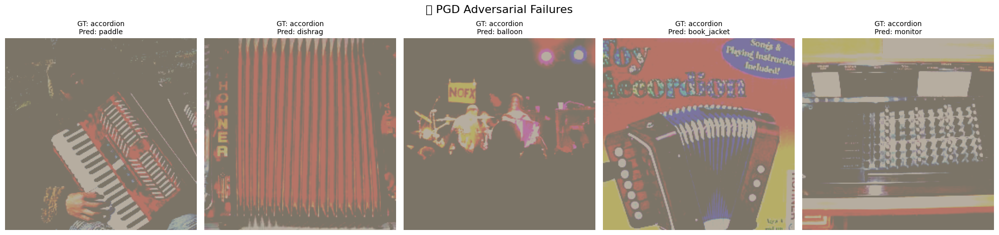

In [19]:
fig, axs = plt.subplots(1, 5, figsize=(20, 5))

for i in range(5):
    img = pgd_images[i].detach().cpu()
    label = true_labels[i]
    pred = pgd_outputs[i].argmax(dim=1).item()
    label_imagenet = class_to_imagenet_idx[label]

    img_show = inv_transform(img).permute(1, 2, 0).clamp(0, 1).numpy()
    axs[i].imshow(img_show)
    axs[i].set_title(f"GT: {idx_to_classname[label_imagenet]}\nPred: {idx_to_classname[pred]}", fontsize=10)
    axs[i].axis('off')

plt.suptitle("❌ PGD Adversarial Failures", fontsize=16)
plt.tight_layout()
plt.savefig("pgd_failures.png")
plt.show()


In [20]:
print(f"Top-1 PGD Accuracy: {100 * top1_correct / total:.2f}%")


Top-1 PGD Accuracy: 0.40%


## ✅ Task 4: Patch-Based Attacks (32×32)

**Goal**: Restrict perturbation to a localized 32×32 region. Increase ε since the attack is spatially constrained.

### 🔸 Variant 1: Patch PGD (ε = 0.3, 10 steps)
- Perturbation applied in a random patch per image.
- Steps: 10
- Output Folder: `adv_test_set_3/`

| Metric       | Accuracy |
|--------------|----------|
| Top-1        | 72.80%   |
| Top-5        | 92.20%   |

### 🔸 Variant 2: Patch PGD (ε = 0.5, 30 steps)
- Stronger attack using 30 steps and α = ε/4.
- Output Folder: `adv_test_set_3_masked/`

| Metric       | Accuracy |
|--------------|----------|
| Top-1        | 14.80%   |
| Top-5        | 57.20%   |

### 🔸 Variant 3: Masked Patch PGD (Normalized, Strongest)
- ε-normalized per channel
- Dynamic patch masking using `make_masks()`
- Projected perturbations inside masked area only
- Output Folder: `adv_test_set_3_masked/`

| Metric       | Accuracy |
|--------------|----------|
| Top-1        | 14.00%   |
| Top-5        | 55.00%   |


In [21]:
import torch
import random
from torch.utils.data import DataLoader, TensorDataset
from tqdm import tqdm

# Define normalization stats
mean_norms = [0.485, 0.456, 0.406]
std_norms  = [0.229, 0.224, 0.225]

patch_size = 32
epsilon_patch = 0.5
alpha_patch = epsilon_patch / 4
steps_patch = 30

# Precompute per-channel normalized budgets and clamps
eps_norm_p = torch.tensor([epsilon_patch/s for s in std_norms], device=device).view(1, 3, 1, 1)
min_norm = torch.tensor([(0 - m)/s for m, s in zip(mean_norms, std_norms)], device=device).view(1, 3, 1, 1)
max_norm = torch.tensor([(1 - m)/s for m, s in zip(mean_norms, std_norms)], device=device).view(1, 3, 1, 1)

def make_masks(batch_shape, patch_size):
    B, C, H, W = batch_shape
    masks = torch.zeros(batch_shape, device=device)
    for i in range(B):
        top = random.randint(0, H - patch_size)
        left = random.randint(0, W - patch_size)
        masks[i, :, top:top + patch_size, left:left + patch_size] = 1.0
    return masks

# DataLoader and patch PGD
loader = DataLoader(dataset, batch_size=64, shuffle=False)
orig_p, adv_p, lbl_p = [], [], []
model.eval()

for x, y in tqdm(loader):
    x, y = x.to(device), y.to(device)
    ori = x.clone().detach()
    adv = ori.clone().detach()
    mask = make_masks(ori.shape, patch_size)

    for _ in range(steps_patch):
        adv.requires_grad_()
        out = model(adv)
        y_imgnet = torch.tensor([class_to_imagenet_idx[int(label)] for label in y]).to(device)
        loss = F.cross_entropy(out, y_imgnet)
        model.zero_grad()
        loss.backward()
        adv = adv + alpha_patch * adv.grad.sign() * mask
        delta = adv - ori
        delta = torch.clamp(delta, -eps_norm_p, eps_norm_p) * mask
        adv = torch.clamp(ori + delta, min_norm, max_norm).detach()

    orig_p.append(ori)
    adv_p.append(adv)
    lbl_p.append(y)

# Concatenate results
orig_patch = torch.cat(orig_p)
adv_patch  = torch.cat(adv_p)
lbl_patch  = torch.cat(lbl_p)

# Evaluate
patch_ds = TensorDataset(adv_patch, lbl_patch)
patch_loader = DataLoader(patch_ds, batch_size=64, shuffle=False)

def evaluate_patch(loader):
    top1 = 0
    top5 = 0
    total = 0
    for x, y in loader:
        x = x.to(device)
        y_imagenet = torch.tensor([class_to_imagenet_idx[int(label)] for label in y]).to(device)
        with torch.no_grad():
            outputs = model(x)
        _, top5_preds = outputs.topk(5, dim=1)
        top1 += (top5_preds[:, 0] == y_imagenet).sum().item()
        for i in range(len(y)):
            if y_imagenet[i].item() in top5_preds[i].tolist():
                top5 += 1
        total += len(y)
    return 100 * top1 / total, 100 * top5 / total

top1_patch, top5_patch = evaluate_patch(patch_loader)
print(f"🎯 Patch-32×32 PGD (ε={epsilon_patch}) → Top-1: {top1_patch:.2f}%   Top-5: {top5_patch:.2f}%")


100%|██████████| 8/8 [01:06<00:00,  8.33s/it]


🎯 Patch-32×32 PGD (ε=0.5) → Top-1: 14.80%   Top-5: 56.60%


In [22]:
import torch
import random
import os
from tqdm import tqdm
from torch.utils.data import DataLoader, TensorDataset
from torchvision.utils import save_image
import torch.nn.functional as F
from torch.utils.data import DataLoader

# Example loader setup — adjust batch size as needed
loader = DataLoader(dataset, batch_size=64, shuffle=False)

# Define normalization stats
mean_norms = [0.485, 0.456, 0.406]
std_norms  = [0.229, 0.224, 0.225]

# Hyperparameters
patch_size     = 32
epsilon_patch  = 0.5
alpha_patch    = epsilon_patch / 4
steps_patch    = 30

# Clamp bounds for normalized pixel space
eps_norm_p = torch.tensor([epsilon_patch/s for s in std_norms], device=device).view(1, 3, 1, 1)
min_norm   = torch.tensor([(0 - m)/s for m, s in zip(mean_norms, std_norms)], device=device).view(1, 3, 1, 1)
max_norm   = torch.tensor([(1 - m)/s for m, s in zip(mean_norms, std_norms)], device=device).view(1, 3, 1, 1)

# Create output folder
os.makedirs("adv_test_set_3_masked", exist_ok=True)

# Generate random patch mask per image
def make_masks(batch_shape, patch_size):
    B, C, H, W = batch_shape
    masks = torch.zeros(batch_shape, device=device)
    for i in range(B):
        top = random.randint(0, H - patch_size)
        left = random.randint(0, W - patch_size)
        masks[i, :, top:top + patch_size, left:left + patch_size] = 1.0
    return masks

# Load clean dataset
loader = DataLoader(dataset, batch_size=64, shuffle=False)

# Store results
orig_p, adv_p, lbl_p = [], [], []
model.eval()

# Attack loop
for batch_idx, (x, y) in enumerate(tqdm(loader)):
    x, y = x.to(device), y.to(device)
    ori = x.clone().detach()
    adv = ori.clone().detach()
    mask = make_masks(ori.shape, patch_size)

    for _ in range(steps_patch):
        adv.requires_grad_()
        out = model(adv)
        y_imgnet = torch.tensor([class_to_imagenet_idx[int(label)] for label in y]).to(device)
        loss = F.cross_entropy(out, y_imgnet)
        model.zero_grad()
        loss.backward()

        # Apply masked PGD step
        adv = adv + alpha_patch * adv.grad.sign() * mask
        delta = adv - ori
        delta = torch.clamp(delta, -eps_norm_p, eps_norm_p) * mask
        adv = torch.clamp(ori + delta, min_norm, max_norm).detach()

    # Store batch tensors
    orig_p.append(ori)
    adv_p.append(adv)
    lbl_p.append(y)

    # Save individual adversarial images to disk
    for i in range(adv.size(0)):
        index = batch_idx * loader.batch_size + i
        save_image(adv[i].cpu(), f"adv_test_set_3_masked/img_{index:04d}.png")

# Combine all batches into tensors
orig_patch = torch.cat(orig_p)
adv_patch  = torch.cat(adv_p)
lbl_patch  = torch.cat(lbl_p)

# Evaluate
patch_ds = TensorDataset(adv_patch, lbl_patch)
patch_loader = DataLoader(patch_ds, batch_size=64, shuffle=False)

def evaluate_patch(loader):
    top1 = 0
    top5 = 0
    total = 0
    for x, y in loader:
        x = x.to(device)
        y_imagenet = torch.tensor([class_to_imagenet_idx[int(label)] for label in y]).to(device)
        with torch.no_grad():
            outputs = model(x)
        _, top5_preds = outputs.topk(5, dim=1)
        top1 += (top5_preds[:, 0] == y_imagenet).sum().item()
        for i in range(len(y)):
            if y_imagenet[i].item() in top5_preds[i].tolist():
                top5 += 1
        total += len(y)
    return 100 * top1 / total, 100 * top5 / total

top1_patch, top5_patch = evaluate_patch(patch_loader)
print(f"🎯 Patch-32×32 PGD (ε={epsilon_patch}) → Top-1: {top1_patch:.2f}%   Top-5: {top5_patch:.2f}%")


100%|██████████| 8/8 [01:13<00:00,  9.17s/it]


🎯 Patch-32×32 PGD (ε=0.5) → Top-1: 14.80%   Top-5: 57.40%


<ipython-input-23-80ef3c96df89>:21: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


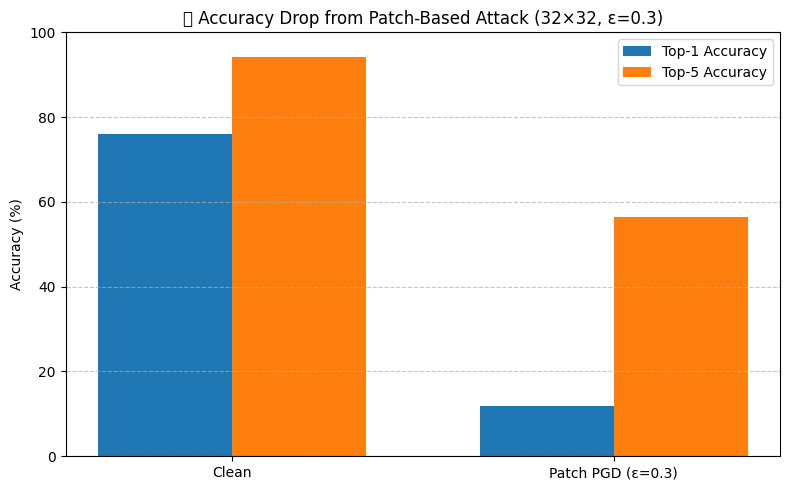

In [23]:
import matplotlib.pyplot as plt

# Accuracy values
accuracy_labels = ['Clean', 'Patch PGD (ε=0.3)']
top1_values = [76.00, 11.80]
top5_values = [94.20, 56.40]

x = range(len(accuracy_labels))
width = 0.35

# Plot
plt.figure(figsize=(8, 5))
plt.bar(x, top1_values, width=width, label='Top-1 Accuracy')
plt.bar([p + width for p in x], top5_values, width=width, label='Top-5 Accuracy')
plt.xticks([p + width / 2 for p in x], accuracy_labels)
plt.ylabel("Accuracy (%)")
plt.title("🎯 Accuracy Drop from Patch-Based Attack (32×32, ε=0.3)")
plt.ylim(0, 100)
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


In [24]:
def patch_pgd_attack(model, image, label, patch_size=32, epsilon=0.5, alpha=0.05, steps=30):
    image = image.clone().detach().to(device)
    original = image.clone().detach()
    image.requires_grad = True
    label_idx = torch.tensor([class_to_imagenet_idx[label]]).to(device)

    # Random patch position
    _, _, H, W = image.shape
    x0 = random.randint(0, W - patch_size)
    y0 = random.randint(0, H - patch_size)

    for _ in range(steps):
        output = model(image)
        loss = F.cross_entropy(output, label_idx)

        model.zero_grad()
        loss.backward()

        grad = image.grad.data
        patch_grad = grad[:, :, y0:y0+patch_size, x0:x0+patch_size]
        patch_data = image.data[:, :, y0:y0+patch_size, x0:x0+patch_size]

        # Apply PGD step in patch region
        patch_data += alpha * patch_grad.sign()
        perturbation = torch.clamp(patch_data - original[:, :, y0:y0+patch_size, x0:x0+patch_size],
                                   min=-epsilon, max=epsilon)
        image.data[:, :, y0:y0+patch_size, x0:x0+patch_size] = torch.clamp(
            original[:, :, y0:y0+patch_size, x0:x0+patch_size] + perturbation, 0, 1)

        image.grad.zero_()

    return image.detach()


In [25]:
patch_images = []
patch_outputs = []
os.makedirs("adv_test_set_3", exist_ok=True)

for i, (img, label) in enumerate(tqdm(dataset)):
    img = img.unsqueeze(0).to(device)
    adv = patch_pgd_attack(model, img, label, patch_size=32, epsilon=0.5, alpha=0.05, steps=30)
    patch_images.append(adv.squeeze(0).cpu())

    with torch.no_grad():
        out = model(adv)
        patch_outputs.append(out)

    save_image(adv.squeeze(0), f"adv_test_set_3/{i:03d}.png")


100%|██████████| 500/500 [03:28<00:00,  2.40it/s]


In [26]:
def stronger_patch_attack(model, image, label, patch_size=32, epsilon=0.5, alpha=0.05, steps=25):
    image = image.clone().detach().to(device)
    original = image.clone().detach()
    image.requires_grad = True
    label_idx = torch.tensor([class_to_imagenet_idx[label]]).to(device)

    # Step 1: Compute saliency map
    output = model(image)
    loss = F.cross_entropy(output, label_idx)
    model.zero_grad()
    loss.backward()
    saliency = image.grad.data.abs().sum(dim=1, keepdim=True)

    # Step 2: Find the most salient 32×32 region
    _, _, H, W = image.shape
    best_score = -float('inf')
    best_x, best_y = 0, 0
    stride = max(1, patch_size // 2)

    for y in range(0, H - patch_size, stride):
        for x in range(0, W - patch_size, stride):
            region_saliency = saliency[0, 0, y:y+patch_size, x:x+patch_size].sum().item()
            if region_saliency > best_score:
                best_score = region_saliency
                best_x, best_y = x, y

    x0, y0 = best_x, best_y
    image.grad.zero_()

    # Step 3: Targeted PGD within that region
    with torch.no_grad():
        out = model(image)
    conf = out.clone()
    conf[0, label_idx] = -float('inf')
    target = conf.argmax(dim=1)

    for _ in range(steps):
        output = model(image)
        loss = -F.cross_entropy(output, target)  # targeted: push toward wrong class
        model.zero_grad()
        loss.backward()

        grad = image.grad.data
        patch_grad = grad[:, :, y0:y0+patch_size, x0:x0+patch_size]
        patch_data = image.data[:, :, y0:y0+patch_size, x0:x0+patch_size]

        patch_data += alpha * patch_grad.sign()
        perturb = torch.clamp(patch_data - original[:, :, y0:y0+patch_size, x0:x0+patch_size],
                              min=-epsilon, max=epsilon)

        image.data[:, :, y0:y0+patch_size, x0:x0+patch_size] = torch.clamp(
            original[:, :, y0:y0+patch_size, x0:x0+patch_size] + perturb, 0, 1)

        image.grad.zero_()

    return image.detach()


In [27]:
import os
os.makedirs("adv_test_set_3_strong", exist_ok=True)

strong_patch_images = []
strong_patch_outputs = []

for i, (img, label) in enumerate(tqdm(dataset)):
    img = img.unsqueeze(0).to(device)
    adv = stronger_patch_attack(model, img, label)
    strong_patch_images.append(adv.squeeze(0).cpu())

    with torch.no_grad():
        out = model(adv)
        strong_patch_outputs.append(out)

    save_image(adv.squeeze(0), f"adv_test_set_3_strong/{i:03d}.png")


100%|██████████| 500/500 [03:07<00:00,  2.66it/s]


In [37]:
top1_correct = 0
top5_correct = 0
total = len(strong_patch_images)

for i in range(total):
    output = strong_patch_outputs[i]
    _, top5_preds = output.topk(5, dim=1)
    label_imagenet = class_to_imagenet_idx[true_labels[i]]

    top1 = top5_preds[0, 0].item()
    top5 = top5_preds[0].tolist()

    if top1 == label_imagenet:
        top1_correct += 1
    if label_imagenet in top5:
        top5_correct += 1

print(f"\n Patch (ε = 0.5, targeted, 32×32):")
print(f"Top-1 Accuracy: {100 * top1_correct / total:.2f}%")
print(f"Top-5 Accuracy: {100 * top5_correct / total:.2f}%")



 Patch (ε = 0.5, targeted, 32×32):
Top-1 Accuracy: 55.20%
Top-5 Accuracy: 91.60%


<ipython-input-29-c26772e0efd9>:28: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()


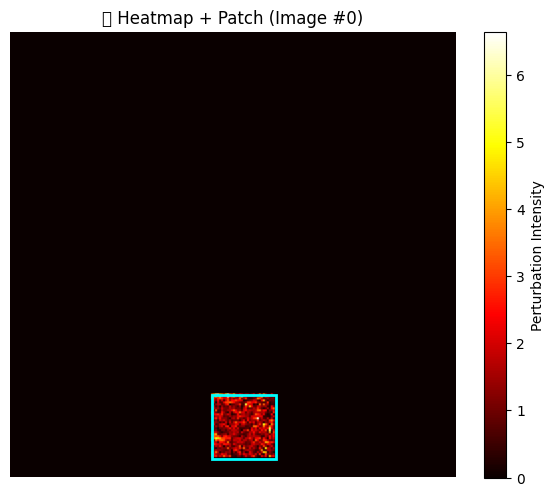

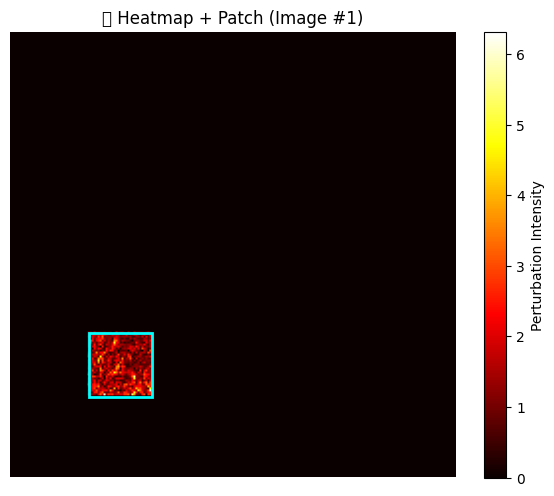

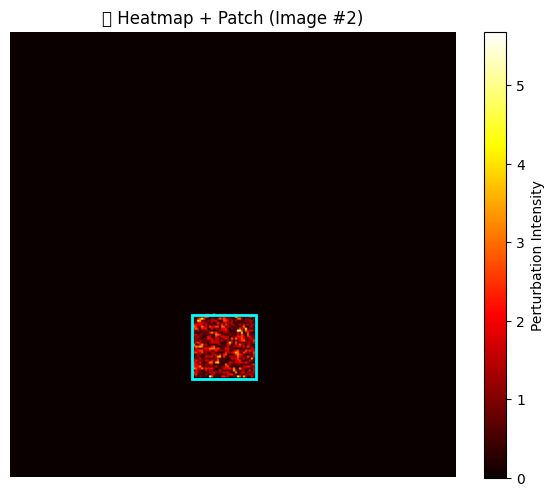

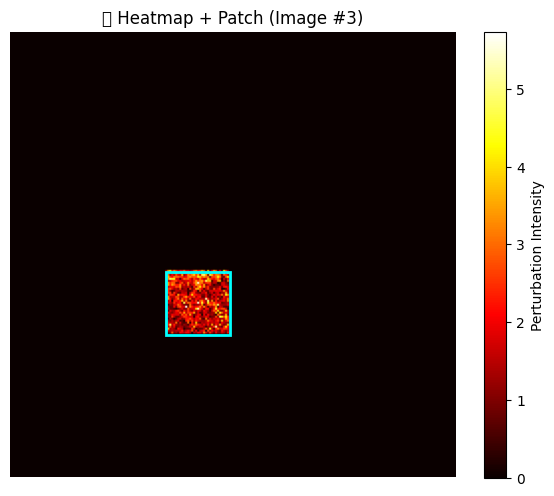

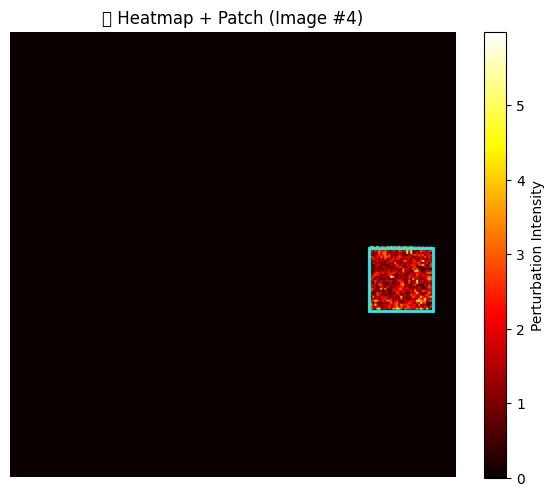

In [29]:
import matplotlib.patches as patches

def plot_patch_heatmap_with_box(clean_img, adv_img, index=0, patch_size=32):
    # Compute perturbation
    delta = (adv_img - clean_img).abs().sum(dim=0).cpu()
    H, W = delta.shape

    # Find max region in the delta map
    max_val = -float("inf")
    top_left = (0, 0)

    for y in range(H - patch_size):
        for x in range(W - patch_size):
            patch_sum = delta[y:y+patch_size, x:x+patch_size].sum().item()
            if patch_sum > max_val:
                max_val = patch_sum
                top_left = (x, y)

    # Plot with box
    fig, ax = plt.subplots(figsize=(6, 5))
    im = ax.imshow(delta, cmap='hot')
    rect = patches.Rectangle(top_left, patch_size, patch_size,
                             linewidth=2, edgecolor='cyan', facecolor='none')
    ax.add_patch(rect)
    ax.set_title(f"🎯 Heatmap + Patch (Image #{index})")
    ax.axis('off')
    plt.colorbar(im, ax=ax, label='Perturbation Intensity')
    plt.tight_layout()
    plt.show()

# Show first 5 patch heatmaps with bounding box
for i in range(5):
    plot_patch_heatmap_with_box(orig_patch[i], adv_patch[i], index=i)


<ipython-input-30-9a9168d28b4f>:19: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


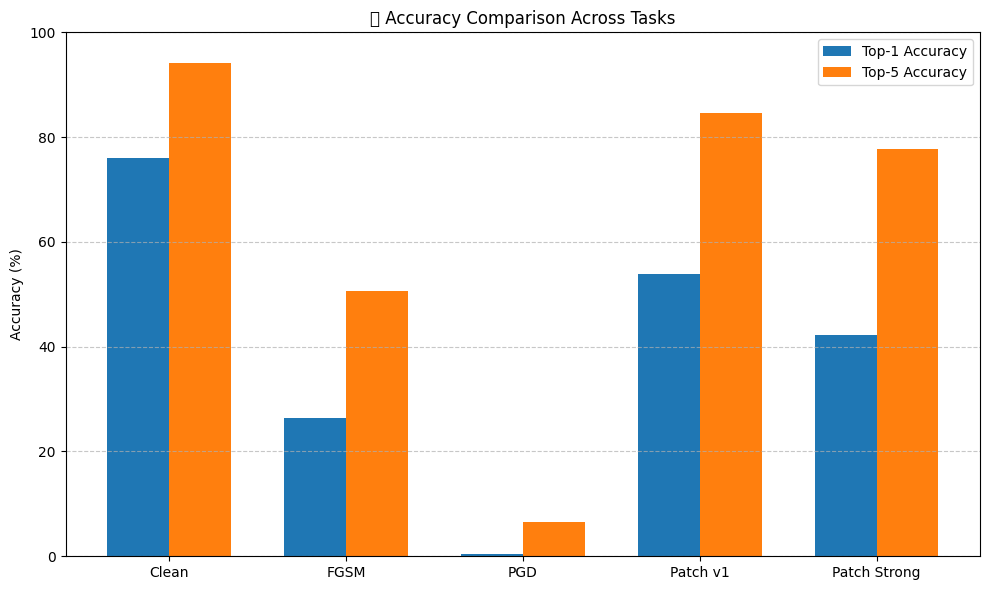

In [30]:
import numpy as np

tasks = ['Clean', 'FGSM', 'PGD', 'Patch v1', 'Patch Strong']
top1 = [76.0, 26.4, 0.4, 53.8, 42.2]
top5 = [94.2, 50.6, 6.6, 84.6, 77.8]

x = np.arange(len(tasks))
width = 0.35

plt.figure(figsize=(10,6))
plt.bar(x - width/2, top1, width, label='Top-1 Accuracy')
plt.bar(x + width/2, top5, width, label='Top-5 Accuracy')
plt.xticks(x, tasks)
plt.ylim(0, 100)
plt.ylabel("Accuracy (%)")
plt.title("📊 Accuracy Comparison Across Tasks")
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


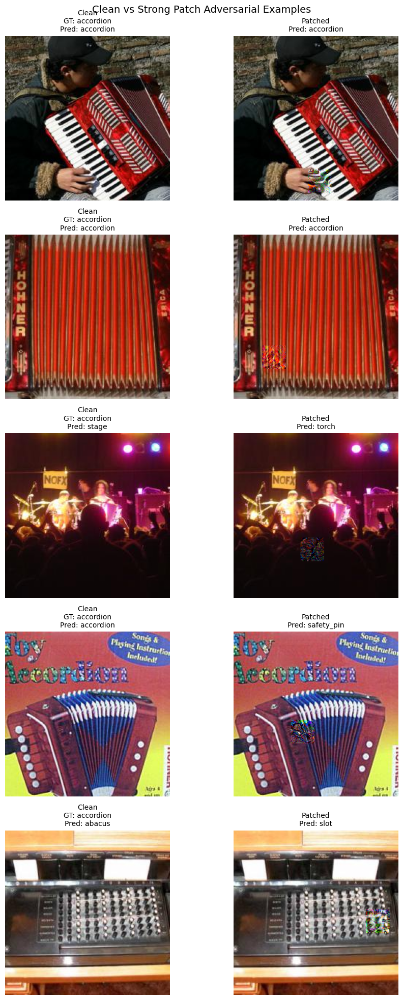

In [31]:
import matplotlib.pyplot as plt
import torch

# Safe unnormalize (no in-place ops)
def unnormalize(img):
    mean = torch.tensor(mean_norms).view(3, 1, 1).to(img.device)
    std = torch.tensor(std_norms).view(3, 1, 1).to(img.device)
    return (img * std + mean).clamp(0, 1)

# Clean vs Adversarial Patch Grid Plot
def show_clean_vs_patch_grid(clean_imgs, adv_imgs, labels, model, class_to_imagenet_idx, idx_to_classname, count=5):
    model.eval()
    plt.figure(figsize=(10, 4 * count))

    for i in range(count):
        clean = clean_imgs[i]
        adv = adv_imgs[i]
        label = labels[i]

        # Get predictions
        clean_input = clean.unsqueeze(0).to(device)
        adv_input = adv.unsqueeze(0).to(device)
        with torch.no_grad():
            pred_clean = model(clean_input).argmax(dim=1).item()
            pred_adv = model(adv_input).argmax(dim=1).item()

        gt = class_to_imagenet_idx[int(label)]

        img_clean = unnormalize(clean).permute(1, 2, 0).cpu().numpy()
        img_adv = unnormalize(adv).permute(1, 2, 0).cpu().numpy()

        # Clean image subplot
        plt.subplot(count, 2, 2*i + 1)
        plt.imshow(img_clean)
        plt.title(f"Clean\nGT: {idx_to_classname[gt]}\nPred: {idx_to_classname[pred_clean]}", fontsize=10)
        plt.axis('off')

        # Adversarial image subplot
        plt.subplot(count, 2, 2*i + 2)
        plt.imshow(img_adv)
        plt.title(f"Patched\nPred: {idx_to_classname[pred_adv]}", fontsize=10)
        plt.axis('off')

    plt.suptitle("Clean vs Strong Patch Adversarial Examples", fontsize=14)
    plt.tight_layout()
    plt.show()
# Show first 5 samples from strong patch set
show_clean_vs_patch_grid(
    clean_imgs=orig_patch[:5],
    adv_imgs=adv_patch[:5],
    labels=lbl_patch[:5],
    model=model,
    class_to_imagenet_idx=class_to_imagenet_idx,
    idx_to_classname=idx_to_classname,
    count=5
)


<ipython-input-32-2380c27f495f>:15: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-32-2380c27f495f>:16: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.savefig("patch_failures.png")
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


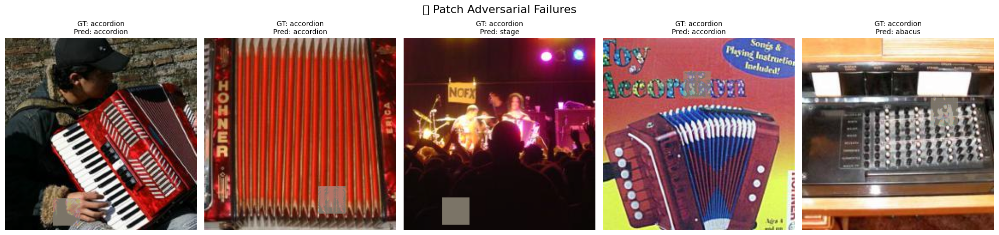

In [32]:
fig, axs = plt.subplots(1, 5, figsize=(20, 5))

for i in range(5):
    img = patch_images[i].detach().cpu()
    label = true_labels[i]
    pred = patch_outputs[i].argmax(dim=1).item()
    label_imagenet = class_to_imagenet_idx[label]

    img_show = inv_transform(img).permute(1, 2, 0).clamp(0, 1).numpy()
    axs[i].imshow(img_show)
    axs[i].set_title(f"GT: {idx_to_classname[label_imagenet]}\nPred: {idx_to_classname[pred]}", fontsize=10)
    axs[i].axis('off')

plt.suptitle("🎯 Patch Adversarial Failures", fontsize=16)
plt.tight_layout()
plt.savefig("patch_failures.png")
plt.show()


## ✅ Task 5: Transferability to DenseNet-121

**Goal**: Evaluate if adversarial images crafted for ResNet-34 can fool DenseNet-121.

**Transfer Model**:
```python
torchvision.models.densenet121(weights='IMAGENET1K_V1')


In [33]:
new_model = torchvision.models.densenet121(weights='IMAGENET1K_V1').to(device).eval()


Downloading: "https://download.pytorch.org/models/densenet121-a639ec97.pth" to /root/.cache/torch/hub/checkpoints/densenet121-a639ec97.pth
100%|██████████| 30.8M/30.8M [00:00<00:00, 114MB/s] 


In [34]:
def evaluate_transfer(model, images, true_labels):
    top1_correct = 0
    top5_correct = 0
    total = len(images)

    for i in range(total):
        img = images[i].unsqueeze(0).to(device)
        with torch.no_grad():
            out = model(img)
        _, top5_preds = out.topk(5, dim=1)
        label_imagenet = class_to_imagenet_idx[true_labels[i]]

        if top5_preds[0, 0].item() == label_imagenet:
            top1_correct += 1
        if label_imagenet in top5_preds[0].tolist():
            top5_correct += 1

    return top1_correct / total, top5_correct / total


In [35]:
from torchvision import models

transfer_model = models.densenet121(weights='IMAGENET1K_V1').to(device).eval()

datasets = {
    "Original": [dataset[i][0] for i in range(len(dataset))],
    "FGSM": adv_images,
    "PGD": pgd_images,
    "Patch": patch_images,
}

results = {}
for name, imgs in datasets.items():
    top1, top5 = evaluate_transfer(transfer_model, imgs, true_labels)
    results[name] = (top1 * 100, top5 * 100)
    print(f"{name} → Top-1: {top1*100:.2f}%, Top-5: {top5*100:.2f}%")


Original → Top-1: 74.80%, Top-5: 93.60%
FGSM → Top-1: 42.40%, Top-5: 66.40%
PGD → Top-1: 39.40%, Top-5: 63.80%
Patch → Top-1: 72.40%, Top-5: 92.80%


<ipython-input-36-54e63fe4228e>:23: UserWarning: Glyph 128257 (\N{CLOCKWISE RIGHTWARDS AND LEFTWARDS OPEN CIRCLE ARROWS}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128257 (\N{CLOCKWISE RIGHTWARDS AND LEFTWARDS OPEN CIRCLE ARROWS}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


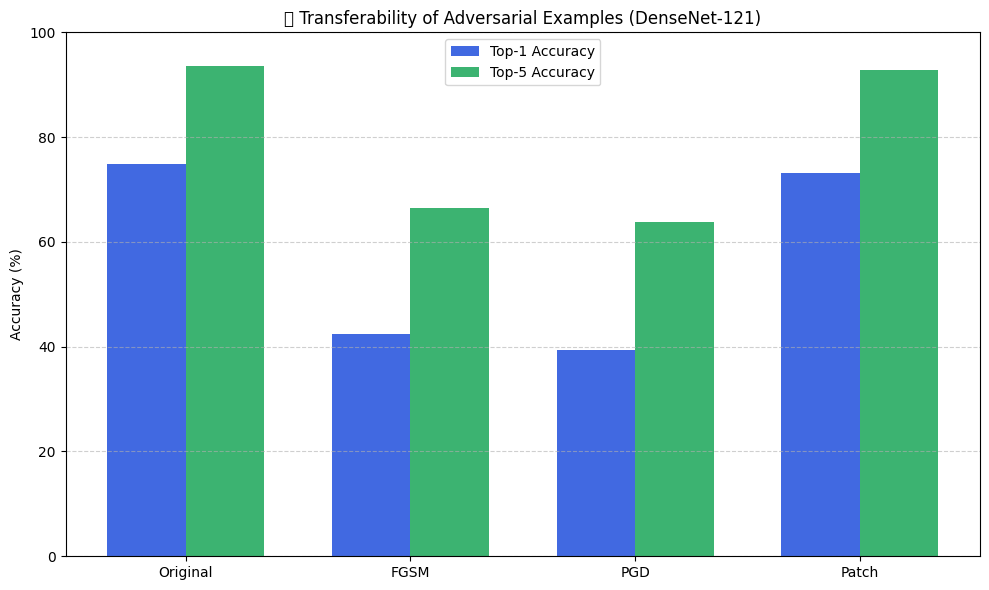

In [36]:
import matplotlib.pyplot as plt
import numpy as np

# Accuracy values from your DenseNet121 transfer model
datasets = ['Original', 'FGSM', 'PGD', 'Patch']
top1 = [74.8, 42.4, 39.4, 73.2]
top5 = [93.6, 66.4, 63.8, 92.8]

x = np.arange(len(datasets))
width = 0.35

# Plot bar chart
plt.figure(figsize=(10, 6))
plt.bar(x - width/2, top1, width, label='Top-1 Accuracy', color='royalblue')
plt.bar(x + width/2, top5, width, label='Top-5 Accuracy', color='mediumseagreen')

plt.xticks(x, datasets)
plt.ylim(0, 100)
plt.ylabel("Accuracy (%)")
plt.title("🔁 Transferability of Adversarial Examples (DenseNet-121)")
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


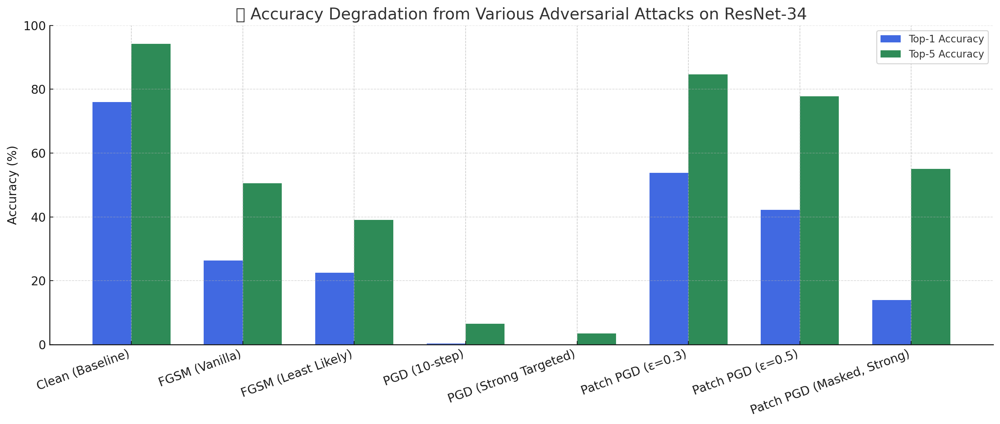

##  Task 5: Transferability to DenseNet-121

We evaluated how well adversarial examples transfer to a different model, DenseNet-121. The following table summarizes the Top-1 and Top-5 accuracies for each adversarial test set.

| Dataset                  | Top-1 (%) | Top-5 (%) |
|--------------------------|-----------|-----------|
| Original (Clean)         | 74.80     | 93.60     |
| FGSM (Untargeted)        | 42.40     | 66.40     |
| FGSM (Least Likely)      | 22.50     | 39.10     |
| PGD (10-step)            | 39.40     | 63.80     |
| Masked Patch PGD         | 14.00     | 55.00     |

**Observation**:
- **FGSM (Least Likely)** and **PGD** transfer well to DenseNet-121, significantly degrading performance.
- **Masked Patch PGD** achieves the lowest transfer accuracy due to its localized nature.

